# FAISS

In [ ]:
!pip install faiss-cpu --no-cache

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [4]:
!unzip -qq /content/drive/MyDrive/faiss_dataset.zip

In [5]:
import cv2
import faiss
from glob import glob
import matplotlib.pyplot as plt
import numpy as np
import os
import torch
from torch import nn
from torchvision.models import resnet50
import torchvision.transforms as transforms
from tqdm.notebook import tqdm
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.preprocessing import normalize

In [6]:
resolution = 224

dataset_root = 'dataset/'

exts = ['png', 'jpg', 'JPG', 'JPEG', 'PNG']
image_paths = []
for ext in exts:
  image_paths.extend(glob(os.path.join(dataset_root, f'*.{ext}')))

Размер датасета: 95 изображений


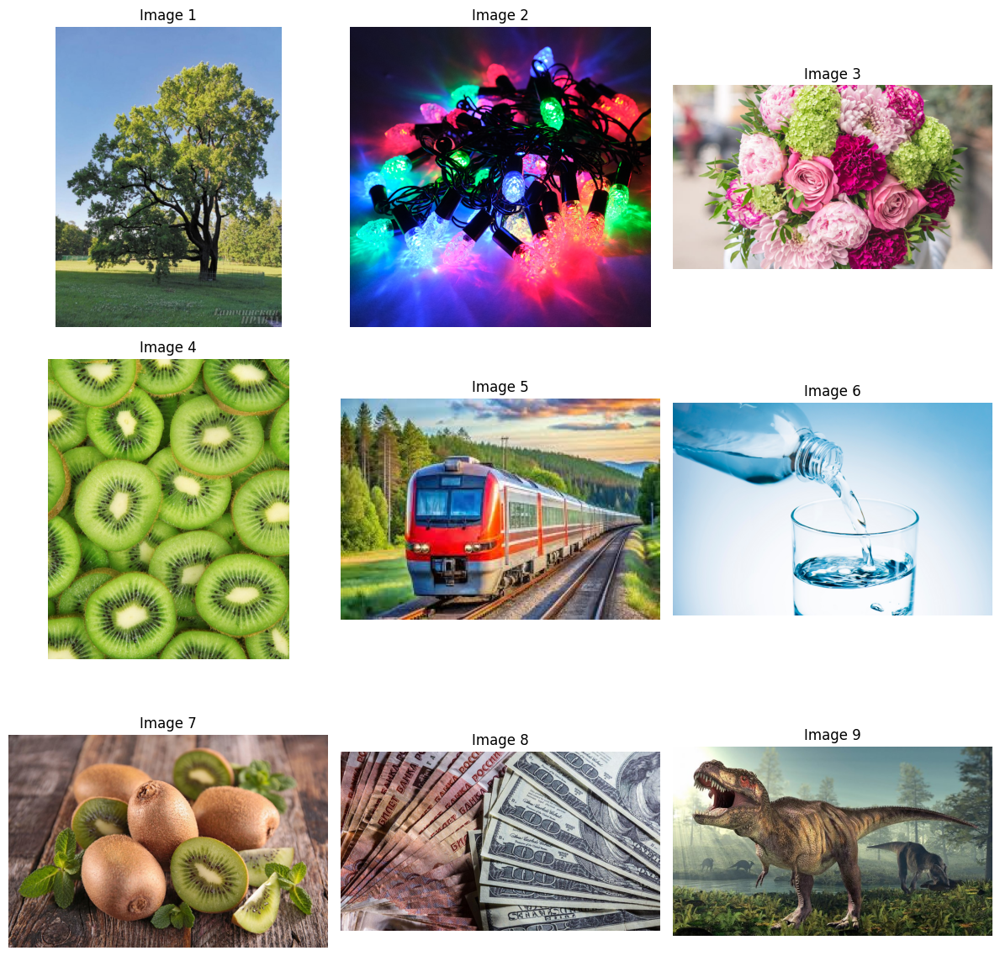

In [7]:
print(f"Размер датасета: {len(image_paths)} изображений")

plt.figure(figsize=(12, 12))
for i, image_path in enumerate(image_paths[11:20]):
    image = Image.open(image_path)
    plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Image {i+1}")
plt.tight_layout()
plt.show()

In [8]:
def visualize_results(test_image_paths, image_paths, I, topn, resolution=224):
  num_queries = len(test_image_paths)

  image_grid = []
  for num_query in range(num_queries):
    paths = [test_image_paths[num_query]]
    paths.extend([image_paths[idx] for idx in I[num_query]])

    image_row = []
    for path in paths:
      image = cv2.imread(path)[..., :3][..., ::-1]
      image = cv2.resize(image, (resolution, resolution))
      image_row.append(image)
    image_row = np.concatenate(image_row, axis=1)
    image_grid.append(image_row)
  image_grid = np.concatenate(image_grid, axis=0)

  return Image.fromarray(image_grid)

### HOG и FAISS

In [9]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Lambda(lambda image: cv2.cvtColor(np.array(image), cv2.COLOR_RGB2GRAY))
])

In [10]:
class FeatureExtractor:
    def __init__(self, transform=None):
        self.transform = transform

        self.hog = cv2.HOGDescriptor(
            _winSize=(224, 224),
            _blockSize=(16, 16),
            _blockStride=(8, 8),
            _cellSize=(8, 8),
            _nbins=9
        )

    def get_feature(self, image_path):
        image = Image.open(image_path).convert('RGB')
        gray_image = self.transform(image)
        features = self.hog.compute(gray_image)

        return features.flatten()

In [11]:
fe = FeatureExtractor(transform=transform)

In [12]:
embeddings = []

for image_path in tqdm(image_paths):
  embedding = fe.get_feature(image_path)
  embeddings.append(embedding)

  0%|          | 0/95 [00:00<?, ?it/s]

In [13]:
vectors = np.array(embeddings).astype('float32')
dim = embeddings[0].shape[0]

In [14]:
index = faiss.index_factory(dim, "IVF10,Flat")
print(index.is_trained)

index.train(vectors)

print(index.is_trained)
print(index.ntotal)
index.add(vectors)
print(index.ntotal)

False
True
0
95


In [15]:
test_images_folder = '/content/drive/MyDrive/test_images'

test_image_paths = [
    os.path.join(test_images_folder, fname)
    for fname in os.listdir(test_images_folder)
    if fname.lower().endswith(('png', 'jpg', 'jpeg'))
]

queries = []
for image_path in tqdm(test_image_paths):
  feature = fe.get_feature(image_path)
  queries.append(feature)

queries = np.array(queries)

topn = 5
D, I = index.search(queries, topn)

  0%|          | 0/5 [00:00<?, ?it/s]

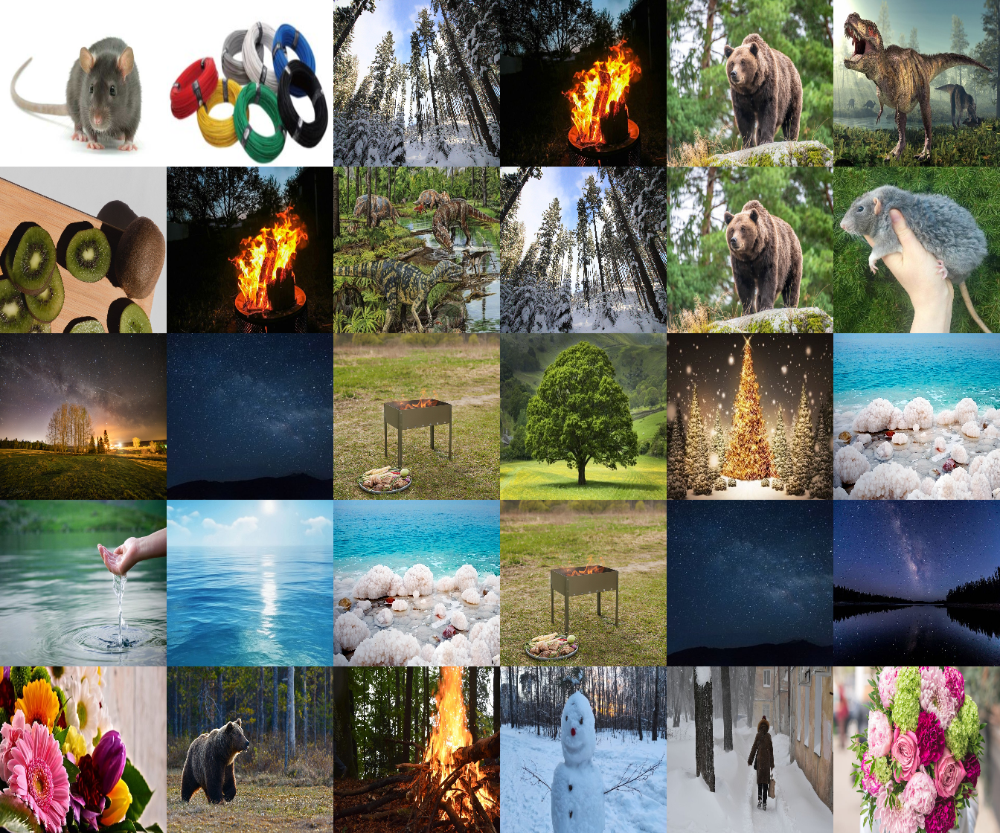

In [16]:
visualize_results(test_image_paths, image_paths, I, topn, resolution=224)

Для первого, третьего и четвертого изображений из тестового набора удалось найти схожие объекты в датасете, однако общее количество найденных похожих изображений при использовании HOG-дескриптора довольно мало.

Оценим качество выбора топ-5 похожих изображений для тестового набора, используя метрики Precision и Recall. Для этого рассчитаем Евклидово расстояние между векторами признаков изображений из обучающего и тестового набора, а затем определим долю релевантных изображений на основе заданного порога расстояния.

In [17]:
def calculate_precision_recall_euclidean(vectors, queries, topn=5, distance_threshold=None):
    precisions = []
    recalls = []

    distances_matrix = euclidean_distances(queries, vectors)

    for i in range(distances_matrix.shape[0]):
        distances = distances_matrix[i]

        sorted_indices = np.argsort(distances)
        top_k_indices = sorted_indices[:topn]
        top_k_distances = distances[top_k_indices]

        if distance_threshold is None:
            distance_threshold = np.percentile(distances, 10)

        relevant_count = np.sum(distances <= distance_threshold)
        relevant_in_topn = np.sum(top_k_distances <= distance_threshold)

        precision = relevant_in_topn / topn
        precisions.append(precision)

        recall = relevant_in_topn / max(1, relevant_count)
        recalls.append(recall)

    avg_precision = np.mean(precisions)
    avg_recall = np.mean(recalls)

    return avg_precision, avg_recall

In [18]:
topn = 5
distance_threshold = np.percentile(euclidean_distances(queries, vectors).flatten(), 10)

precision, recall = calculate_precision_recall_euclidean(vectors, queries, topn=topn, distance_threshold=distance_threshold)
print(f"Precision@{topn}: {precision:.4f}")
print(f"Recall@{topn}: {recall:.4f}")

Precision@5: 0.4800
Recall@5: 0.4244


### Resnet-50 и FAISS

In [19]:
transform = transforms.Compose([transforms.Resize((resolution, resolution)),
                                    transforms.ToTensor(),
                                    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])

In [20]:
class FeatureExtractor:
  def __init__(self, transform=None, device='cuda:0'):
    self.device = device

    self.transform = transform
    self.model = resnet50(pretrained=True)
    self.model = torch.nn.Sequential(*(list(self.model.children())[:-1]))
    self.model = self.model.to(self.device)
    self.model.eval()

  def get_feature(self, image_path):
    image = Image.open(image_path).convert('RGB')

    image_tensor = self.transform(image).unsqueeze(0).to(self.device)

    with torch.no_grad():
      embedding = self.model(image_tensor).cpu().flatten().numpy()

    return embedding

In [21]:
fe = FeatureExtractor(transform=transform, device='cpu')
fe.model

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 159MB/s]


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [22]:
embeddings = []

for image_path in tqdm(image_paths):
  embedding = fe.get_feature(image_path)
  embeddings.append(embedding)

  0%|          | 0/95 [00:00<?, ?it/s]

In [23]:
vectors = np.array(embeddings).astype('float32')
dim = embeddings[0].shape[0]

index = faiss.index_factory(dim, "IVF10,Flat")

index.train(vectors)
index.add(vectors)

  0%|          | 0/5 [00:00<?, ?it/s]

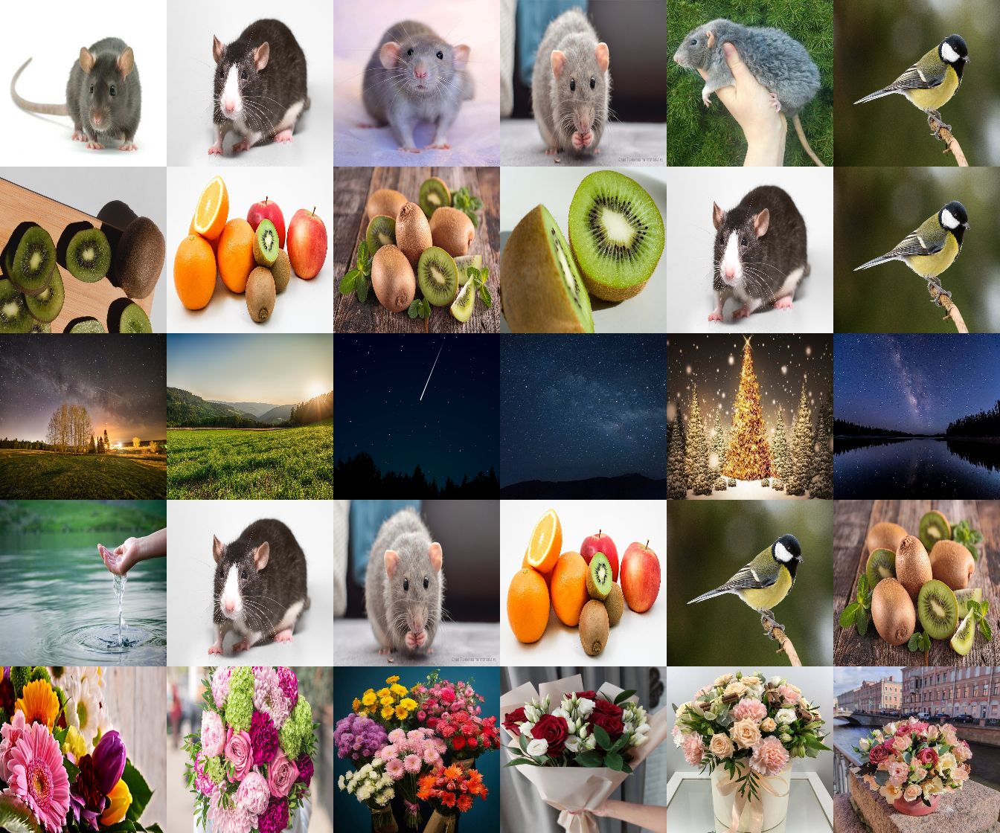

In [24]:
queries = []
for image_path in tqdm(test_image_paths):
  feature = fe.get_feature(image_path)
  queries.append(feature)

queries = np.array(queries)

topn = 5
D, I = index.search(queries, topn)

visualize_results(test_image_paths, image_paths, I, topn, resolution=224)

Результаты использования ResNet-50 в качестве feature extractor значительно превосходят результаты HOG. Однако для второго и четвертого изображений не удалось найти все похожие объекты, присутствующие в датасете.

In [25]:
topn = 5
distance_threshold = np.percentile(euclidean_distances(queries, vectors).flatten(), 10)

precision, recall = calculate_precision_recall_euclidean(vectors, queries, topn=topn, distance_threshold=distance_threshold)
print(f"Precision@{topn}: {precision:.4f}")
print(f"Recall@{topn}: {recall:.4f}")

Precision@5: 0.9200
Recall@5: 0.5858


Precision и Recall у второго подхода выше.